In [1]:
import pyVIA.core as via
import scvelo as scv
import scanpy as sc
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

ModuleNotFoundError: No module named 'pyVIA'

In [5]:
adata = scv.datasets.pancreas()
print(adata)

n_pcs =80
n_neighbors=30

scv.pp.filter_and_normalize(adata, min_shared_counts=20)
sc.pp.pca(adata, n_comps=n_pcs)
print('Start scvelo...')
title = 'scVelo stochastic mode' 
scv.pp.moments(adata, n_pcs=n_pcs, n_neighbors=n_neighbors)
scv.tl.velocity(adata, mode='stochastic')

AnnData object with n_obs × n_vars = 3696 × 27998
    obs: 'clusters_coarse', 'clusters', 'S_score', 'G2M_score'
    var: 'highly_variable_genes'
    uns: 'clusters_coarse_colors', 'clusters_colors', 'day_colors', 'neighbors', 'pca'
    obsm: 'X_pca', 'X_umap'
    layers: 'spliced', 'unspliced'
    obsp: 'distances', 'connectivities'
Filtered out 20801 genes that are detected 20 counts (shared).
Normalized count data: X, spliced, unspliced.
Logarithmized X.


/home/satwik/stavia/lib/python3.10/site-packages/scvelo/preprocessing/utils.py:705: DeprecationWarning: `log1p` is deprecated since scVelo v0.3.0 and will be removed in a future version. Please use `log1p` from `scanpy.pp` instead.
  log1p(adata)


Start scvelo...
computing neighbors
    finished (0:00:00) --> added 
    'distances' and 'connectivities', weighted adjacency matrices (adata.obsp)
computing moments based on connectivities


/tmp/ipykernel_43851/108075895.py:11: DeprecationWarning: Automatic neighbor calculation is deprecated since scvelo==0.4.0 and will be removed in a future version of scVelo. Please compute neighbors first with Scanpy.
  scv.pp.moments(adata, n_pcs=n_pcs, n_neighbors=n_neighbors)
/home/satwik/stavia/lib/python3.10/site-packages/scvelo/preprocessing/moments.py:71: DeprecationWarning: `neighbors` is deprecated since scvelo==0.4.0 and will be removed in a future version of scVelo. Please compute neighbors with Scanpy.
  neighbors(


    finished (0:00:01) --> added 
    'Ms' and 'Mu', moments of un/spliced abundances (adata.layers)
computing velocities


/home/satwik/stavia/lib/python3.10/site-packages/scvelo/tools/optimization.py:184: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  gamma[i] = np.linalg.pinv(A.T.dot(A)).dot(A.T.dot(y[:, i]))


    finished (0:00:02) --> added 
    'velocity', velocity vectors for each individual cell (adata.layers)


In [6]:
scv.tl.velocity_graph(adata)

computing velocity graph (using 1/12 cores)


  0%|          | 0/3696 [00:00<?, ?cells/s]

    finished (0:00:16) --> added 
    'velocity_graph', sparse matrix with cosine correlations (adata.uns)


computing velocity embedding
    finished (0:00:00) --> added
    'velocity_umap', embedded velocity vectors (adata.obsm)


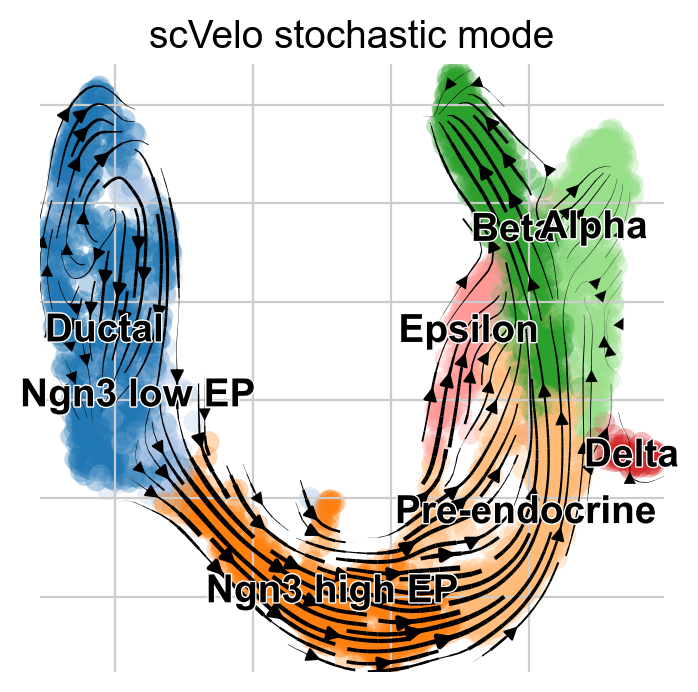

In [7]:
adata.uns['clusters_colors'] = ['#1f77b4', '#aec7e8', '#ff7f0e', '#ffbb78', '#2ca02c', '#98df8a', '#d62728', '#ff9896', '#9467bd', '#c5b0d5']
scv.pl.velocity_embedding_stream(adata, color='clusters', dpi=100, title=title)

In [42]:
adata.obs.iloc[11]

clusters_coarse                  Ductal
clusters                         Ductal
S_score                        0.664332
G2M_score                      0.276411
initial_size_unspliced           1148.0
initial_size_spliced             9720.0
initial_size                     9720.0
n_counts                    5512.787109
velocity_self_transition       0.194951
Name: AAACGGGAGTCAATAG, dtype: object

In [38]:
v0.root

[12]

In [9]:
velocity_matrix = adata.layers['velocity']
gene_matrix = adata.X.todense()
embedding_original = adata.obsm['X_pca'][:, 0:2]
data_pca = adata.obsm['X_pca'][:, 0:n_pcs]

root = ['Ductal']
random_seed = 0
jac_std_global = 0.15
cluster_graph_pruning_std=0.3
velo_weight = 0.5 # equal contribution of velocity and gene similarity towards the direction of edges

true_label = [i for i in adata.obs['clusters']]

v0 = via.VIA(data=data_pca, true_label=true_label, knn=n_neighbors,
 root_user=root, dataset='group', random_seed=random_seed,
           is_coarse=True, preserve_disconnected=True, 
             piegraph_arrow_head_width=0.8,    piegraph_edgeweight_scalingfactor=2.5, velocity_matrix=velocity_matrix,
                    gene_matrix=gene_matrix, velo_weight=velo_weight)
v0.run_VIA()

2025-03-12 11:13:00.370487	Running VIA over input data of 3696 (samples) x 80 (features)
2025-03-12 11:13:00.370586	Knngraph has 30 neighbors
2025-03-12 11:13:02.135305	Finished global pruning of 30-knn graph used for clustering at level of 0.15. Kept 47.1 % of edges. 
2025-03-12 11:13:02.152766	Number of connected components used for clustergraph  is 1
2025-03-12 11:13:02.300677	Commencing community detection
2025-03-12 11:13:02.586367	Finished community detection. Found 77 clusters.
2025-03-12 11:13:02.587473	Merging 60 very small clusters (<10)
2025-03-12 11:13:02.588759	Finished detecting communities. Found 17 communities
2025-03-12 11:13:02.588954	Making cluster graph. Global cluster graph pruning level: 0.15
2025-03-12 11:13:02.597397	Graph has 1 connected components before pruning
2025-03-12 11:13:02.598772	Graph has 1 connected components after pruning
2025-03-12 11:13:02.598936	Graph has 1 connected components after reconnecting
2025-03-12 11:13:02.599362	0.0% links trimmed fr

  0%|          | 0/1300 [00:00<?, ?it/s]

memory for rw2 hittings times  2. Using rw2 based pt
2025-03-12 11:13:08.149346	Identifying terminal clusters corresponding to unique lineages...
2025-03-12 11:13:08.149388	Closeness:[0, 2, 3, 4, 5, 6, 7]
2025-03-12 11:13:08.149398	Betweenness:[0, 2, 3, 4, 6, 7, 8, 10, 12, 14]
2025-03-12 11:13:08.149404	Out Degree:[0, 2, 3, 4, 5, 6, 9, 11, 14]
2025-03-12 11:13:08.149569	Cluster 3 had 3 or more neighboring terminal states [2, 4, 5] and so we removed cluster 2
2025-03-12 11:13:08.149679	Terminal clusters corresponding to unique lineages in this component are [3, 4, 5, 6, 14] 
2025-03-12 11:13:08.149696	Calculating lineage probability at memory 5


  0%|          | 0/1000 [00:00<?, ?it/s]

2025-03-12 11:13:12.025983	Cluster or terminal cell fate 3 is reached 676.0 times
2025-03-12 11:13:12.051253	Cluster or terminal cell fate 4 is reached 547.0 times
2025-03-12 11:13:12.074843	Cluster or terminal cell fate 5 is reached 702.0 times
2025-03-12 11:13:12.099132	Cluster or terminal cell fate 6 is reached 382.0 times
2025-03-12 11:13:12.122556	Cluster or terminal cell fate 14 is reached 243.0 times
2025-03-12 11:13:12.128418	There are (5) terminal clusters corresponding to unique lineages {3: 'Beta', 4: 'Beta', 5: 'Alpha', 6: 'Alpha', 14: 'Delta'}
2025-03-12 11:13:12.128457	Begin projection of pseudotime and lineage likelihood
2025-03-12 11:13:12.792733	Transition matrix with weight of 0.5 on RNA velocity
2025-03-12 11:13:12.793323	Cluster graph layout based on forward biasing
2025-03-12 11:13:12.796202	Starting make edgebundle viagraph...
2025-03-12 11:13:12.796250	Make via clustergraph edgebundle
2025-03-12 11:13:13.135480	Hammer dims: Nodes shape: (17, 2) Edges shape: (50, 

/home/satwik/stavia/lib/python3.10/site-packages/pyVIA/core.py:2905: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  viridis_cmap = cm.get_cmap('viridis_r')


In [10]:
from pyVIA.core import plot_piechart_viagraph

tune edges False


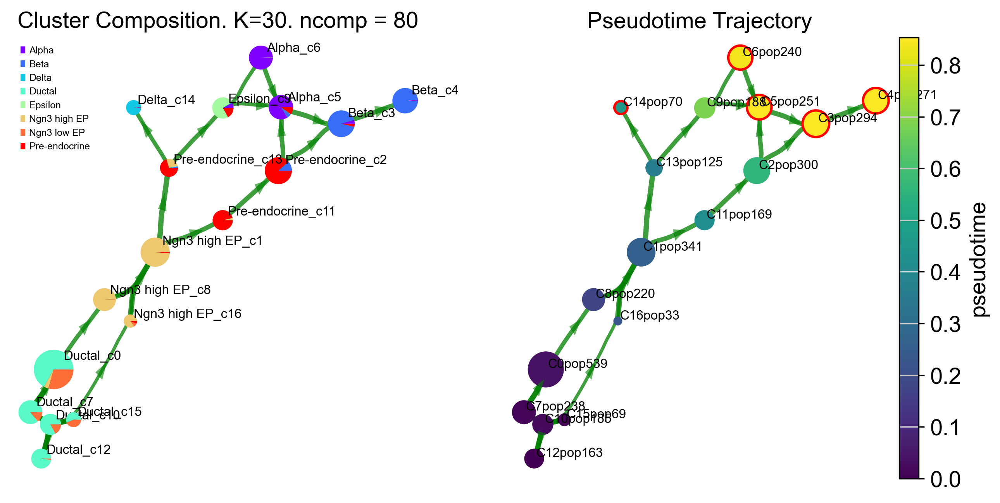

In [11]:
fig, ax, ax2= plot_piechart_viagraph(via_object=v0, type_data='pt', title='Trajectory', cmap='viridis', ax_text=True, gene_exp='', alpha_edge=0.5, linewidth_edge=1.5, edge_color='green', headwidth_arrow=0.2)
fig.set_size_inches(10,5)

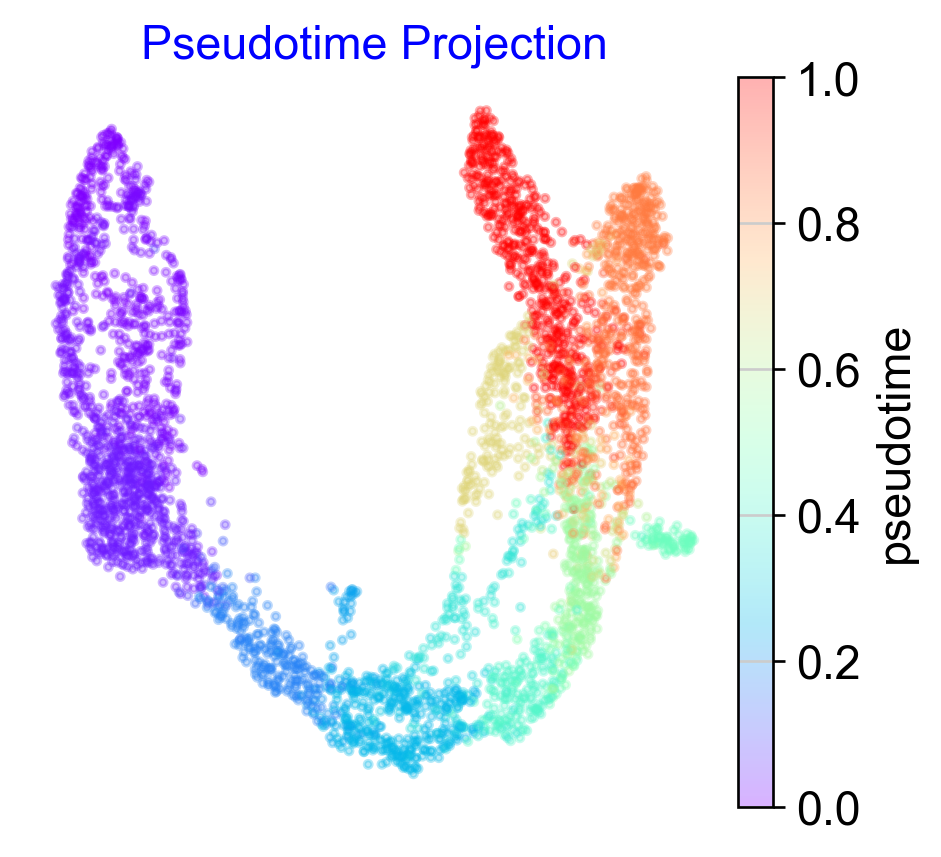

In [12]:
via.plot_scatter(embedding=adata.obsm['X_umap'], 
                labels=v0.single_cell_pt_markov, 
                title='Pseudotime Projection')
plt.show()

(<Figure size 800x800 with 1 Axes>,
 <Axes: title={'center': 'Via original tsne'}>)

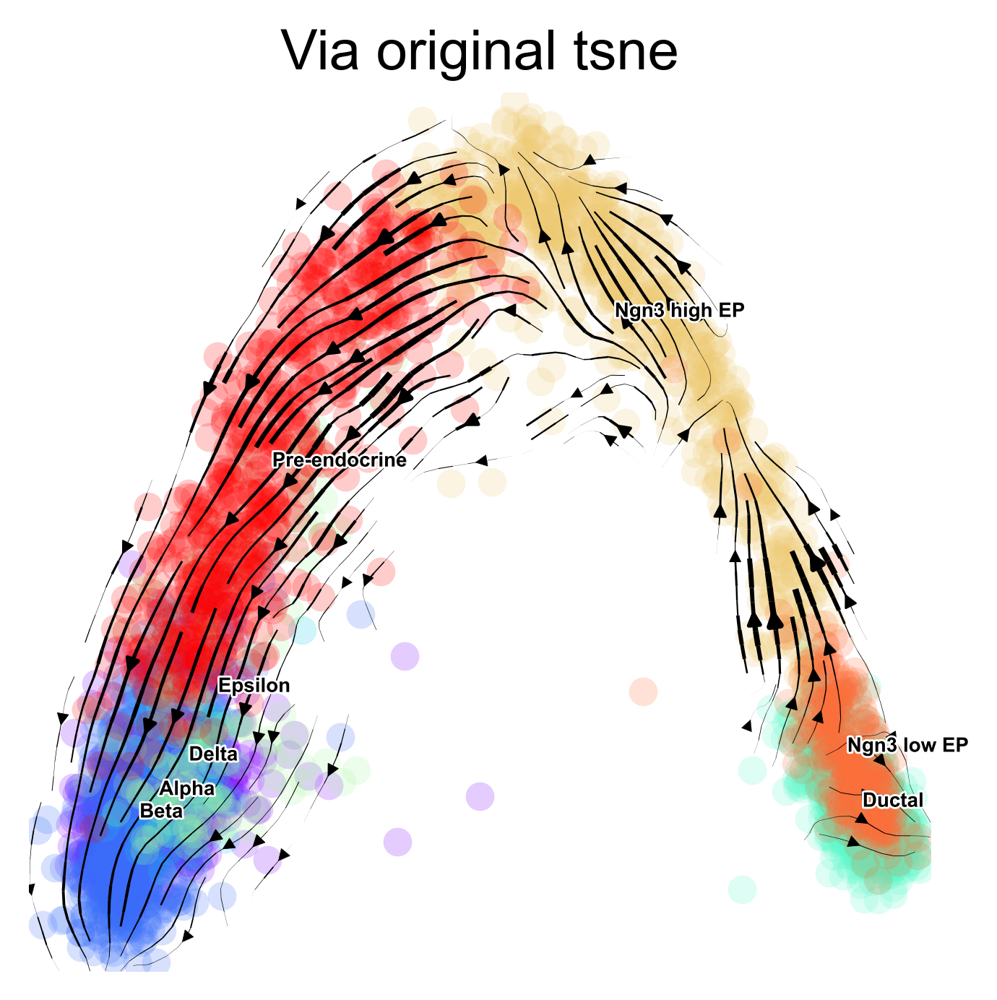

In [13]:
fig.set_size_inches(5,1)
via.via_streamplot(via_object=v0, embedding=embedding_original, scatter_size=50, scatter_alpha=0.2,
                   marker_edgewidth=0.05, density_stream=2.0, density_grid=1, smooth_transition=2,
                   smooth_grid=0.5, color_scheme='annotation', add_outline_clusters=False,
                   cluster_outline_edgewidth=0.001, title='Via original tsne', dpi=200)
# plt.show()

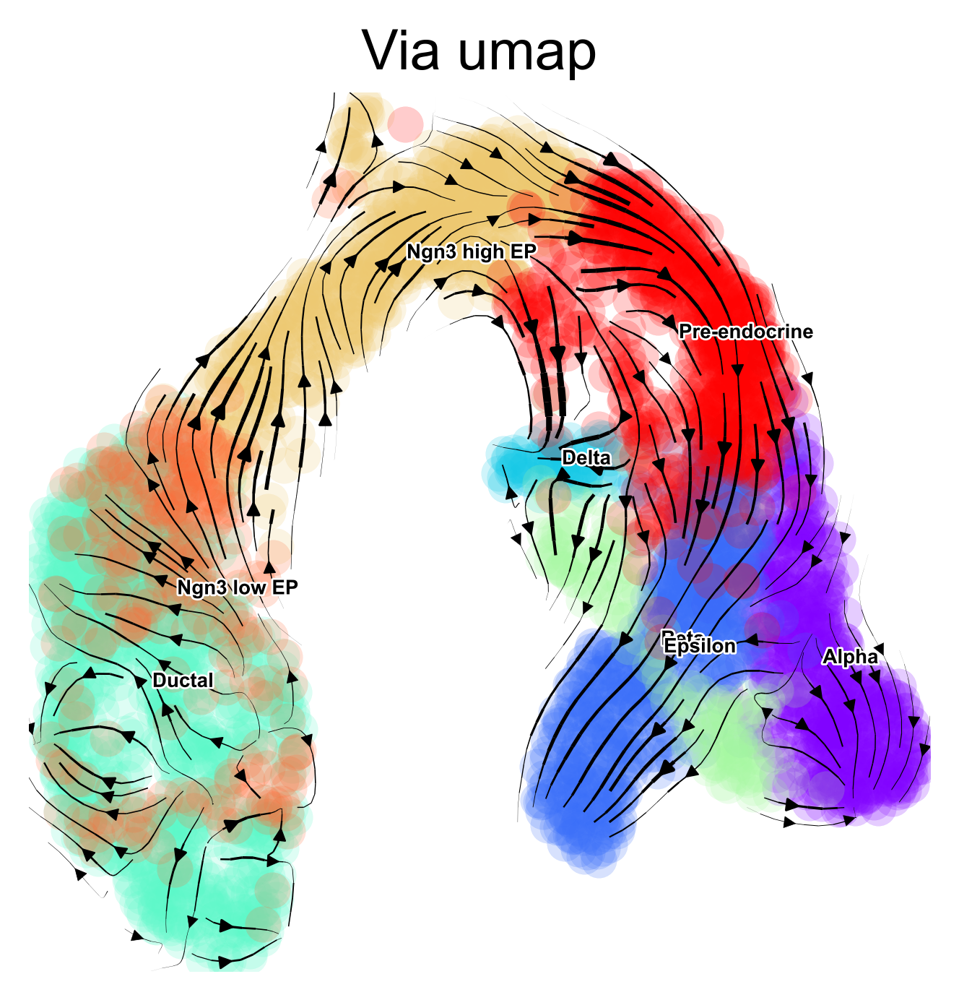

In [14]:
sc.tl.umap(adata, min_dist=0.8)
embedding_umap = adata.obsm['X_umap']

via.via_streamplot(via_object=v0, embedding=embedding_umap, scatter_size=80, scatter_alpha=0.2,
                   marker_edgewidth=0.05, density_stream=2.0, density_grid=1, smooth_transition=1,
                   smooth_grid=0.5, color_scheme='annotation', add_outline_clusters=False,
                   cluster_outline_edgewidth=0.001, title='Via umap', dpi=200)
plt.show()


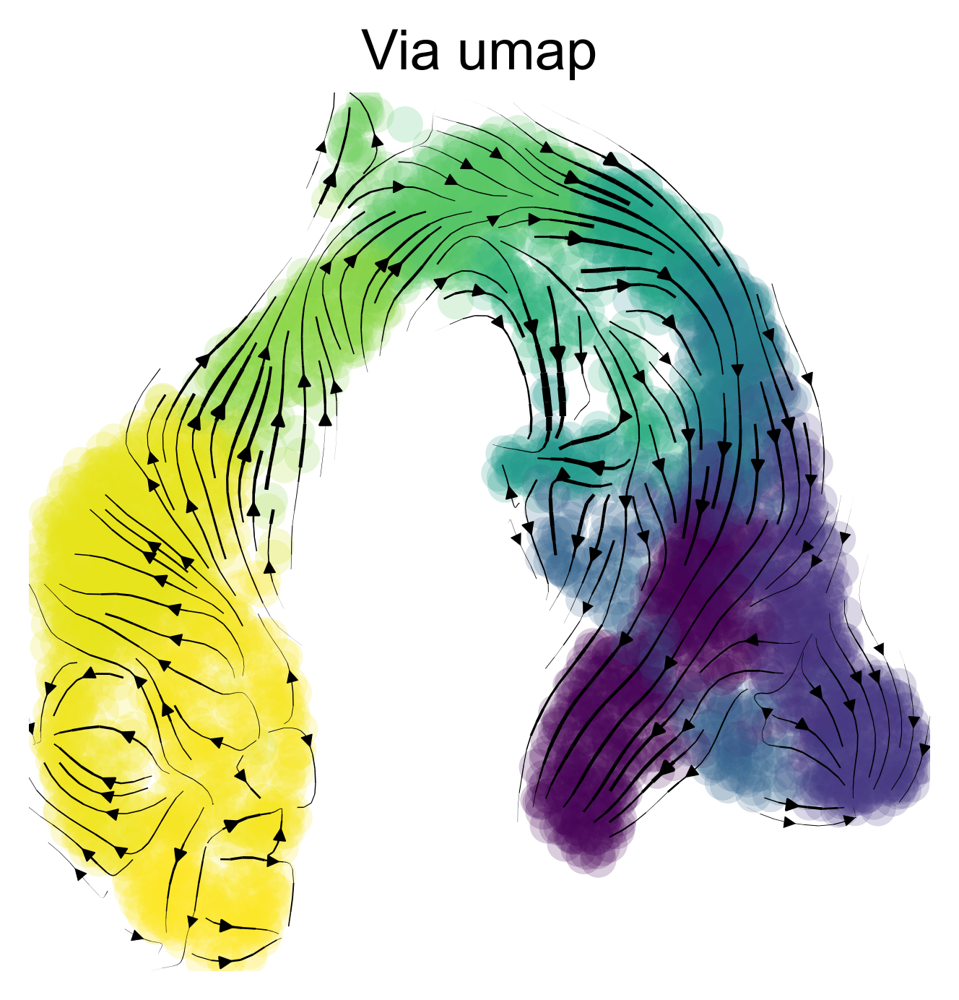

In [15]:
via.via_streamplot(via_object=v0, embedding=embedding_umap, scatter_size=80, scatter_alpha=0.2,
                   marker_edgewidth=0.05, density_stream=2.0, density_grid=1, smooth_transition=1,
                   smooth_grid=0.5, color_scheme='time', add_outline_clusters=False,
                   cluster_outline_edgewidth=0.001, title='Via umap', dpi=200)
plt.show()

  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################      

2025-03-12 11:14:01.349947	Super cluster 3 is a super terminal with sub_terminal cluster 3
2025-03-12 11:14:01.350299	Super cluster 4 is a super terminal with sub_terminal cluster 4
2025-03-12 11:14:01.350337	Super cluster 5 is a super terminal with sub_terminal cluster 5
2025-03-12 11:14:01.350369	Super cluster 6 is a super terminal with sub_terminal cluster 6
2025-03-12 11:14:01.350408	Super cluster 14 is a super terminal with sub_terminal cluster 14


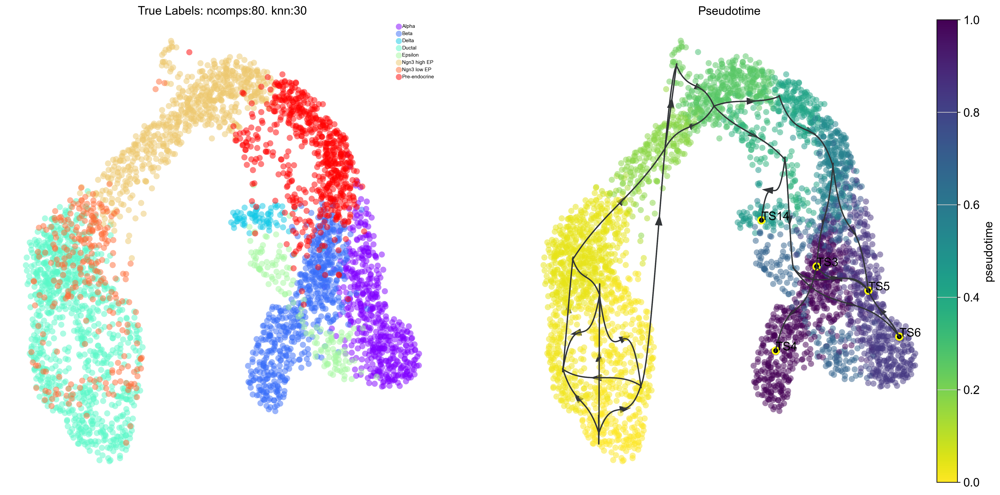

In [16]:
via.plot_trajectory_curves(via_object=v0, embedding=embedding_umap)# or set  embedding=embedding_of_your_choice
plt.show()

2025-03-12 11:23:28.715169	Marker_lineages: [3, 4, 5, 6, 14]
2025-03-12 11:23:28.718111	The number of components in the original full graph is 1
2025-03-12 11:23:28.718158	For downstream visualization purposes we are also constructing a low knn-graph 
2025-03-12 11:23:29.226177	Check sc pb 1.0 
f getting majority comp
2025-03-12 11:23:29.267640	Cluster path on clustergraph starting from Root Cluster 12 to Terminal Cluster 3: [12, 7, 0, 8, 1, 11, 2, 3]
2025-03-12 11:23:29.267676	Cluster path on clustergraph starting from Root Cluster 12 to Terminal Cluster 4: [12, 7, 0, 8, 1, 11, 2, 3, 4]
2025-03-12 11:23:29.267692	Cluster path on clustergraph starting from Root Cluster 12 to Terminal Cluster 5: [12, 7, 0, 8, 1, 11, 2, 5]
2025-03-12 11:23:29.267704	Cluster path on clustergraph starting from Root Cluster 12 to Terminal Cluster 6: [12, 7, 0, 8, 1, 13, 9, 6]
2025-03-12 11:23:29.267714	Cluster path on clustergraph starting from Root Cluster 12 to Terminal Cluster 14: [12, 7, 0, 8, 1, 13, 14

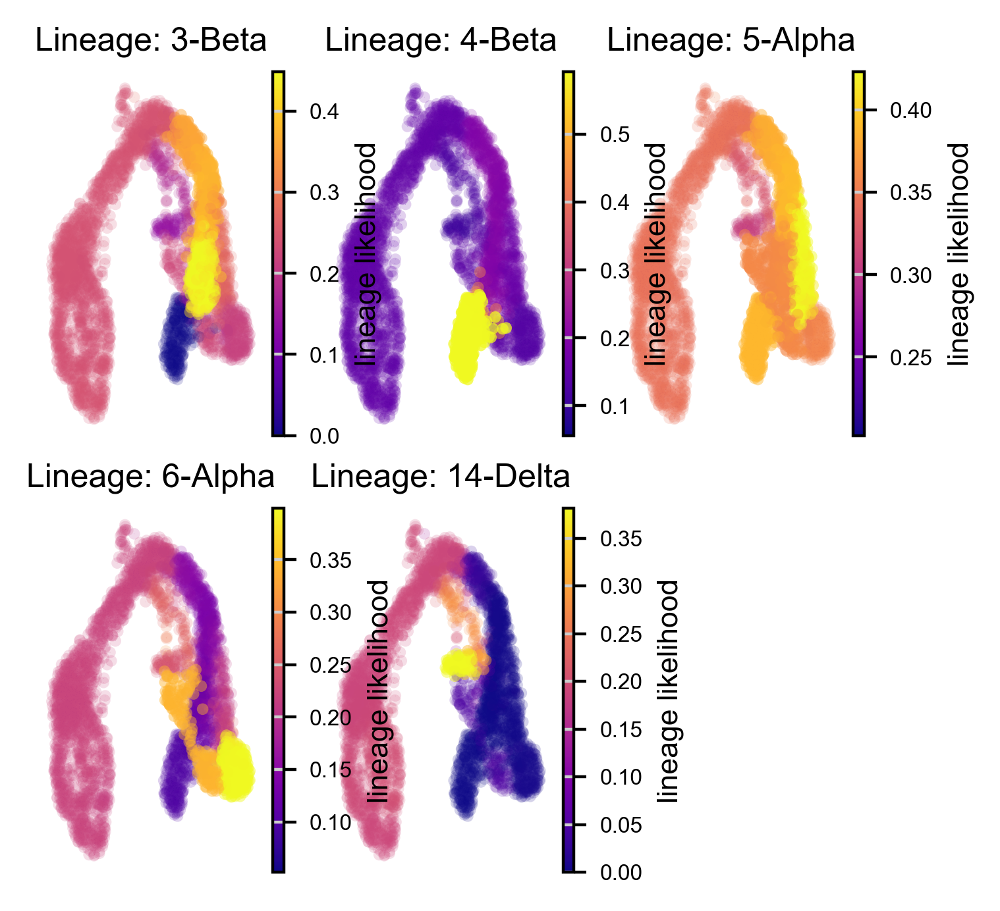

In [ ]:
f, axs = via.plot_sc_lineage_probability(via_object=v0, embedding=embedding_umap, dpi=200, ) #or set  embedding=embedding_of_your_choice
plt.show()
# f.set_size_inches(100,100)    

In [1]:
import scanpy as sc
adata = sc.read_h5ad('mouse-cell-atlas-combination-2.h5ad')

In [3]:
import pyVIA.core as via

In [7]:
adata

AnnData object with n_obs × n_vars = 3211 × 2218
    uns: 'end_id', 'end_milestones', 'group_id', 'milestone_network', 'milestone_percentages', 'start_id', 'start_milestones', 'timecourse'

In [23]:
import omicverse as ov
import scanpy as sc
import matplotlib.pyplot as plt

# Initialize environment
ov.utils.ov_plot_set()


   ____            _     _    __                  
  / __ \____ ___  (_)___| |  / /__  _____________ 
 / / / / __ `__ \/ / ___/ | / / _ \/ ___/ ___/ _ \ 
/ /_/ / / / / / / / /__ | |/ /  __/ /  (__  )  __/ 
\____/_/ /_/ /_/_/\___/ |___/\___/_/  /____/\___/                                              

Version: 1.6.10, Tutorials: https://omicverse.readthedocs.io/
Dependency error: The 'bioservices' distribution was not found and is required by the application


In [24]:
sc.tl.pca(adata, svd_solver='arpack', n_comps=50)  # Compute PCA

# VIA configuration parameters
via_params = {
    'adata_key': 'X_pca',  # Use PCA embeddings
    'ncomps': 30,          # Number of PCA components to use
    'clusters': 'clusters',# Cluster column in adata.obs
    'random_seed': 42,     # Reproducibility
    'x_lazy': 0.95,        # Lazy walk probability
    'alpha_teleport': 0.99 # Teleportation probability
}


computing PCA
    with n_comps=50
    finished (0:00:02)


In [26]:
v0 = ov.single.pyVIA.VIA(
    adata=adata,
    **via_params
)
v0.run()

AttributeError: type object 'pyVIA' has no attribute 'VIA'